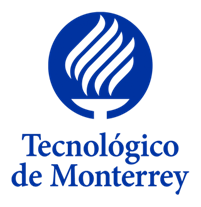

## Visión Computacional para imágenes y video (Gpo 10)

### Profesores: 
* Dr. Gilberto Ochoa Ruiz
* Mtra. Yetnalezi Quintas Ruiz

### Equipo 4

### Alumnos: 
* Armando Bringas Corpus - A01200230
* Guillermo Alfonso Muñiz Hermosillo - A01793101
* Jorge Luis Arroyo Chavelas - A01793023
* Samantha R Mancias Carrillo - A01196762
* Sofia E Mancias Carrillo - A01196563

# 10. Morphological Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Erosion](#erosion)
3. [Dilation](#dilation)
4. [Opening](#opening)
5. [Closing](#closing)
6. [Morphological Gradient](#gradient)
7. [Morphological Hats](#hats)
   1. [Top or White Hat](#top)
   1. [Black Hat](#black)
8. [Exercises](#exercises)
    1. [Erosion Aplication](#erosionapp)
    1. [Dilation Aplication](#dilationapp)
    1. [Opening and Closing Aplications](#openandcloseapp)  
9. [References](#references)



## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
img = cv2.imread("data/image.jpg")
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("data/image.jpg",0)

(400, 700, 3) (400, 700, 3) (400, 700)


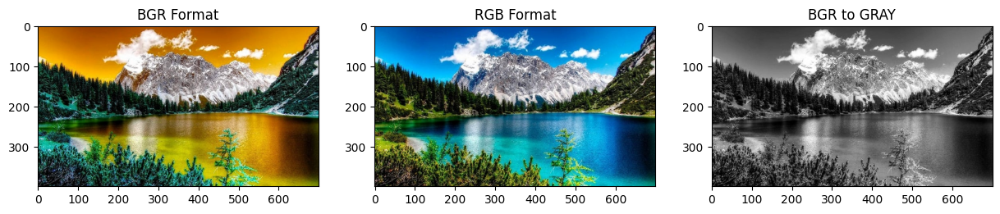

In [3]:
#function to see image
def imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3):
    print(img.shape,img1.shape,img2.shape)
    fig = plt.figure(figsize=(15,8))
    #adds a subplot at 1st position
    fig.add_subplot(rows,columns,1)
    plt.title('BGR Format')
    plt.imshow(img)

    #adds a subplot at 2nd position
    fig.add_subplot(rows,columns,2)
    plt.title('RGB Format')
    plt.imshow(img1)

    #adds a subplot at 3rd position
    fig.add_subplot(rows,columns, 3)
    plt.title('BGR to GRAY')
    plt.imshow(img2,cmap="gray")
    plt.show()
    
imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3)

## Erosion <a class="anchor" id="erosion" ></a>

Erosion primarily involves eroding(thinning) outer surface(foreground) of image
- The is suggested to have foreground as white 

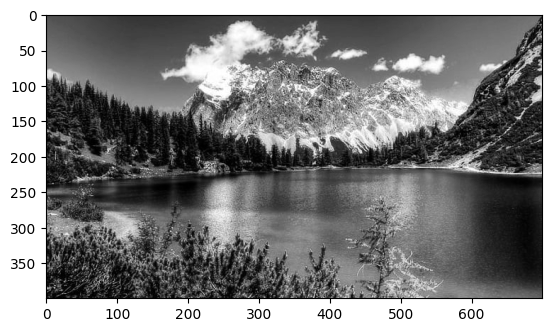

In [4]:
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

Eroding boundary of image up to 3 level

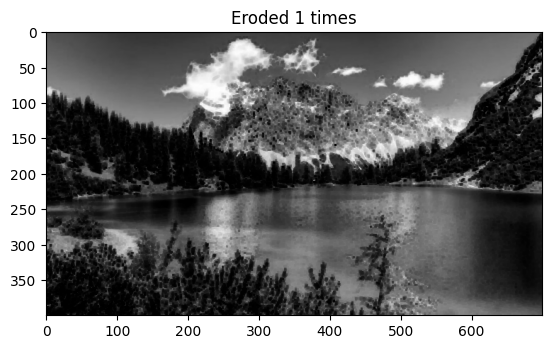

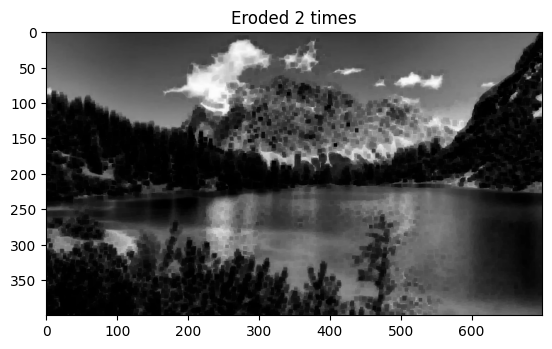

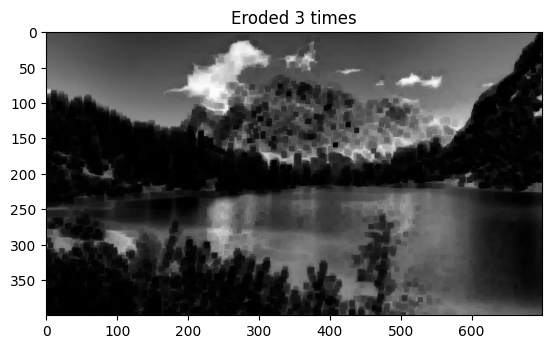

In [5]:
def plt_imshow(title, image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.show()
    
for i in range(0,3):
    eroded = cv2.erode(BGR2GRAY.copy(), None, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

### Binarize Image

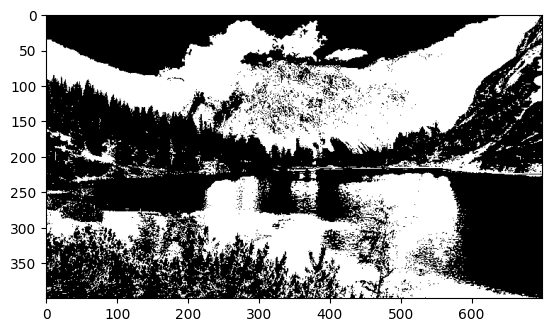

In [6]:
binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
image = cv2.cvtColor(binr, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

### We can Invert Image to keep foreground in white

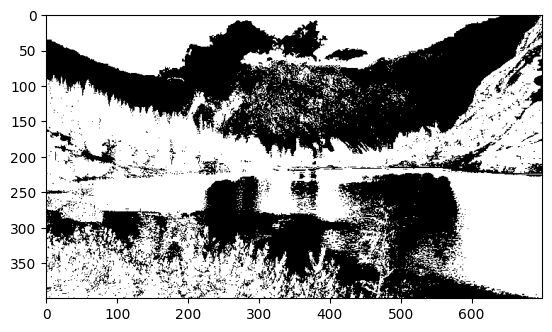

In [7]:
invert = cv2.bitwise_not(binr)
image = cv2.cvtColor(invert, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

Then, we can define a kernel of $5 \times 5$ to use in erosion

In [8]:
kernel = np.ones((5,5), np.uint8) #check for 3*3 or 7*7 kernel size too
print(kernel)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


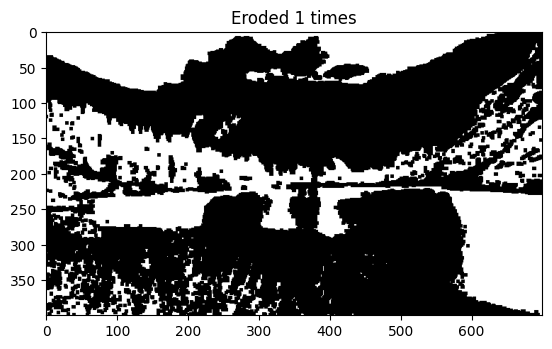

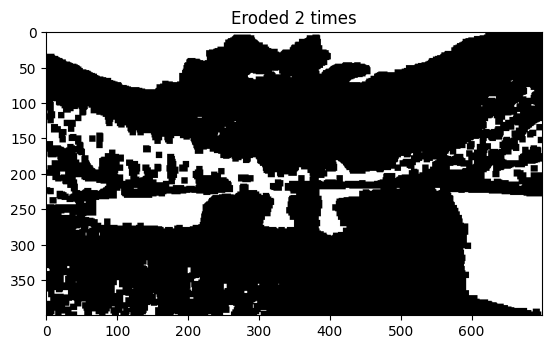

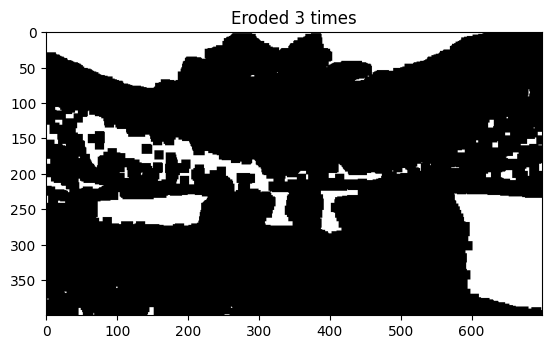

In [9]:
for i in range(0,3):
    eroded = cv2.erode(invert.copy(),kernel=kernel, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

## Dilation <a class="anchor" id="dilation" ></a>

Involves dilating outer surface (foreground) of image
- For joining broken parts of an image together

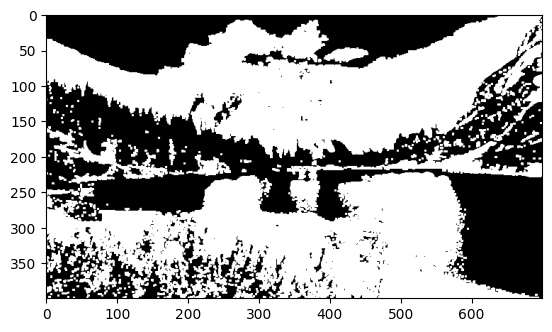

In [10]:
#binarize image
binr = cv2.threshold(BGR2GRAY,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
kernel = np.ones((3,3),np.uint8)
invert = cv2.bitwise_not(binr)

#dilate image
dilation = cv2.dilate(binr, kernel, iterations=1)
 
plt.imshow(dilation, cmap='gray')
plt.show()

We can apply series of dilations on inverted image using no kernel


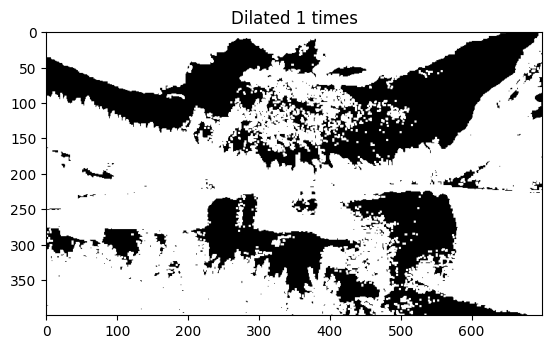

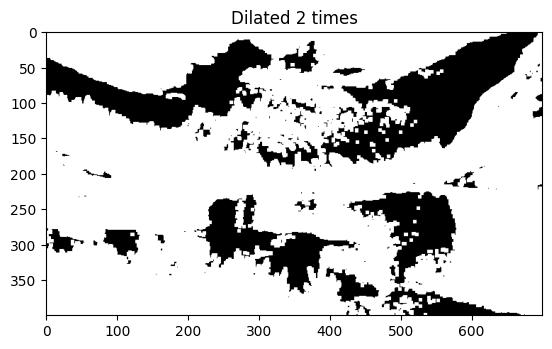

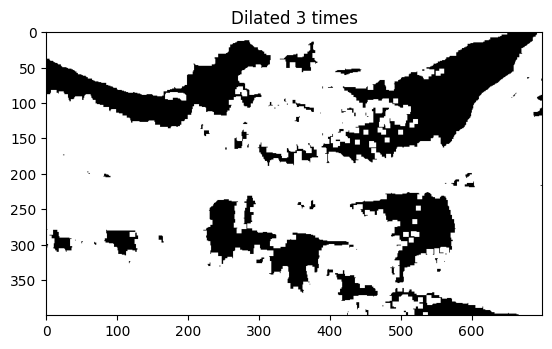

In [11]:
for i in range(0,3):
    dilated = cv2.dilate(invert.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

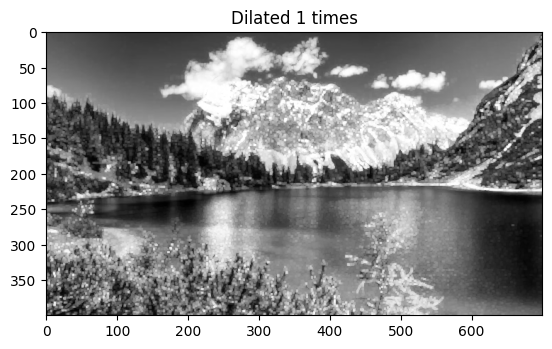

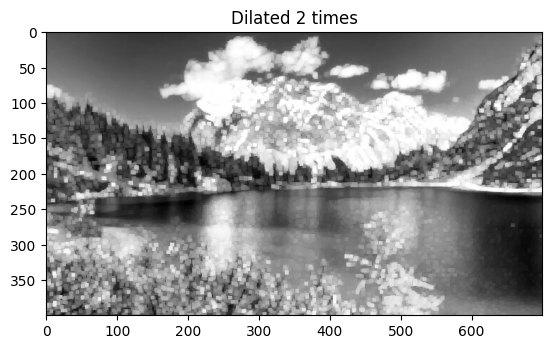

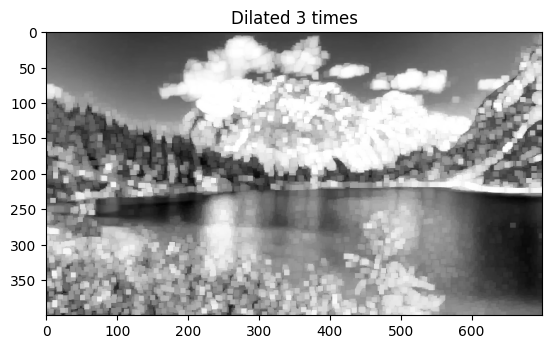

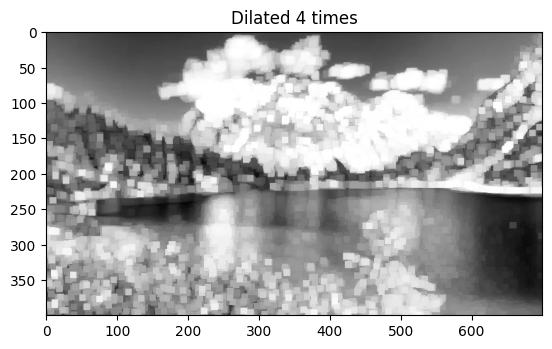

In [12]:
for i in range(0,4):
    dilated = cv2.dilate(BGR2GRAY.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

## Opening <a class="anchor" id="opening" ></a>

Erosion followed by dilation in outer surface (foreground) of image
- Generally used to remove noise (small blobs) in image


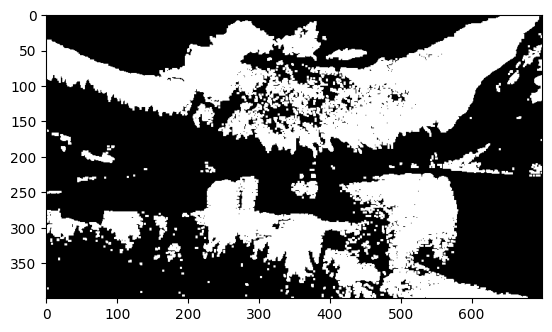

In [13]:
#opening image
opening = cv2.morphologyEx(binr,cv2.MORPH_OPEN,kernel,iterations=1)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

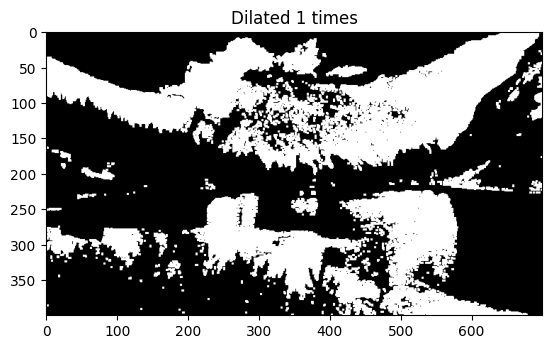

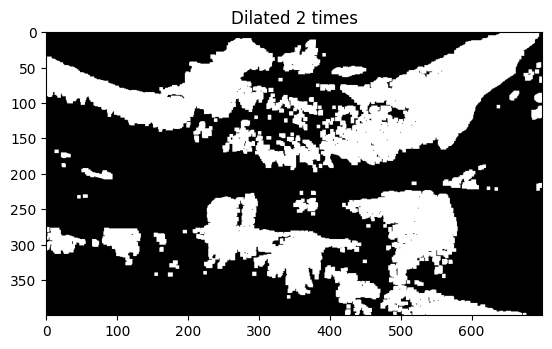

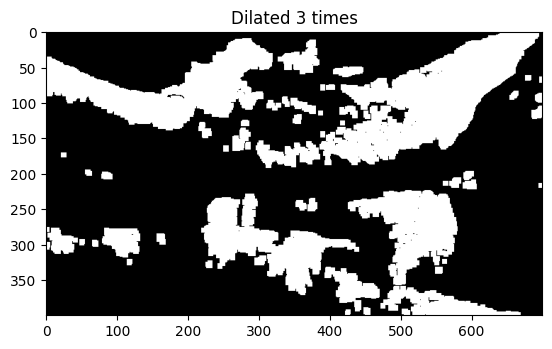

In [14]:
for i in range(0,3):
    opening = cv2.morphologyEx(binr.copy(),cv2.MORPH_OPEN,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),opening)
    plt.show()

## Closing <a class="anchor" id="closing" ></a>

Dilation followed by erosion in outer surface (foreground) of image
- Generally used to close holes inside of objects or for connecting components together

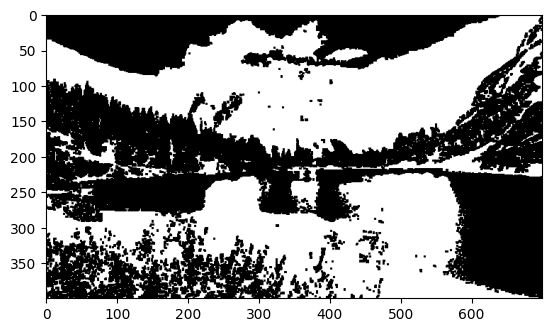

In [15]:
#closing image
closing = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel, iterations=1)
 
#print output
plt.imshow(closing,cmap='gray')
plt.show()

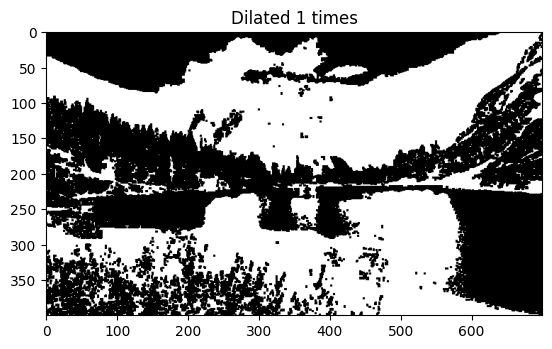

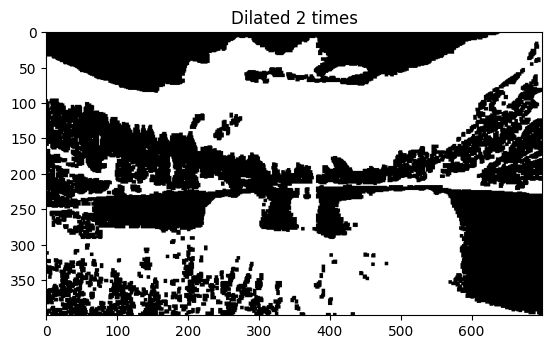

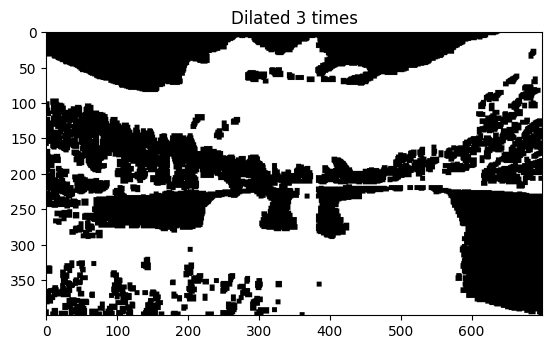

In [16]:
for i in range(0,3):
    closing = cv2.morphologyEx(binr.copy(),cv2.MORPH_CLOSE,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),closing)
    plt.show()

Iterating with different kernels

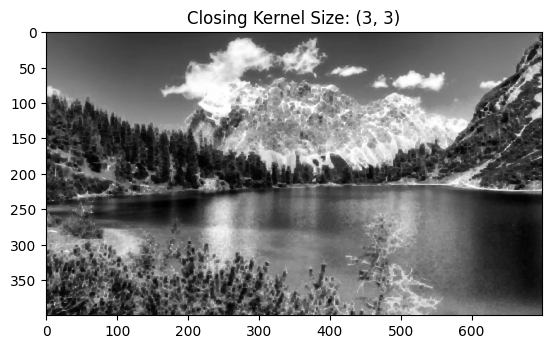

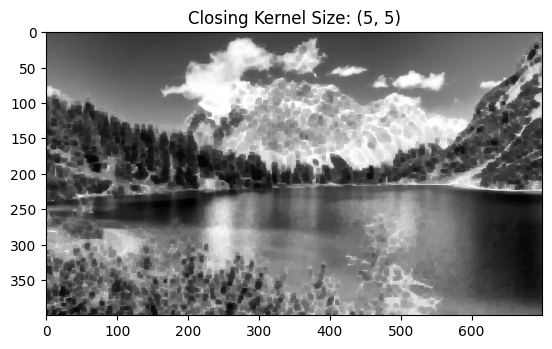

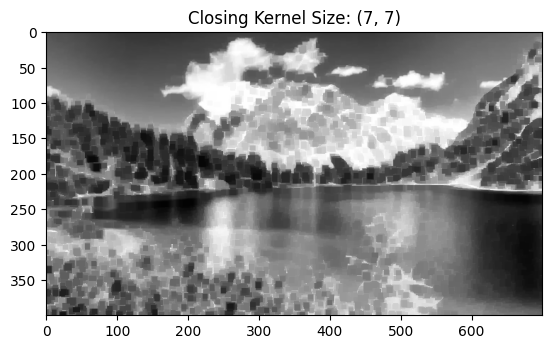

In [17]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    closing = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_CLOSE, kernel)
    plt_imshow("Closing Kernel Size: ({}, {})".format(kernelSize[0], kernelSize[1]), closing)

## Morphological Gradient <a class="anchor" id="gradient" ></a>

It first applies erosion and dilation individually on image and then computes difference between eroded and dilated image

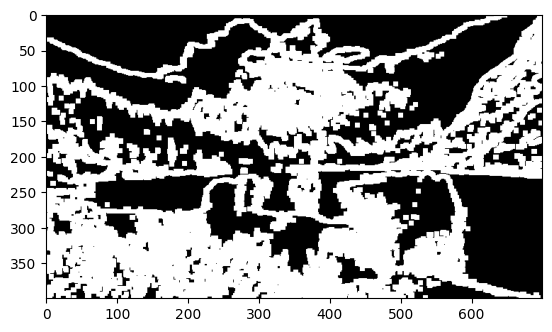

In [18]:
# use morph gradient
morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel)
 
#print output
plt.imshow(morph_gradient, cmap='gray')
plt.show()

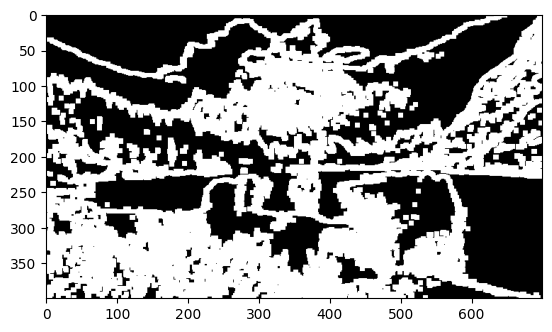

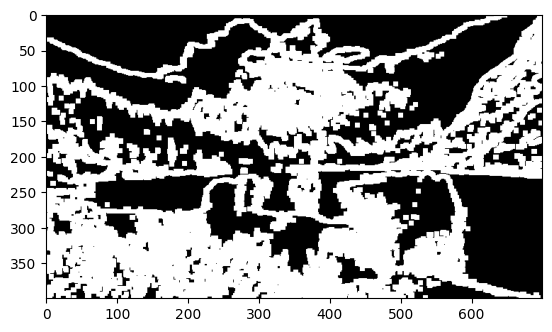

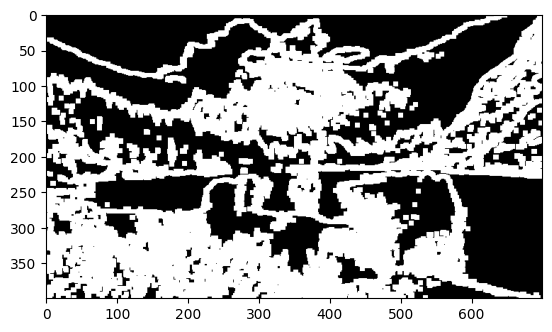

In [19]:
for i in range(0,3): 
    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel+i)
    #print output
    plt.imshow(morph_gradient, cmap='gray')
    plt.show()

Iterating with different kernels

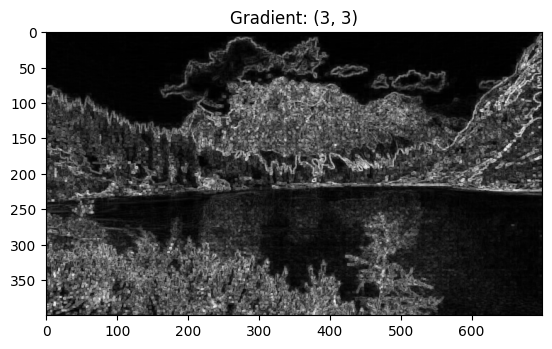

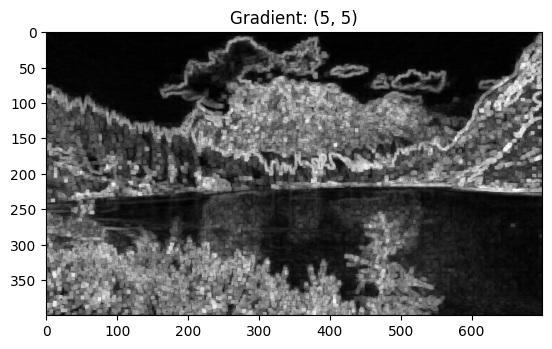

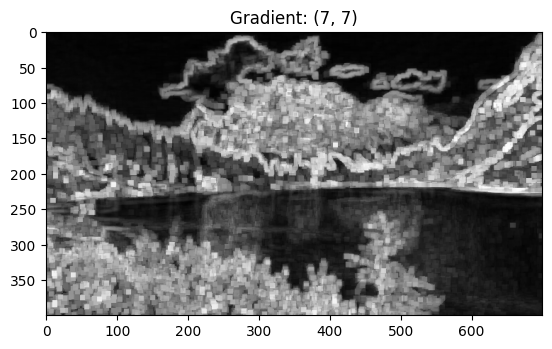

In [20]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    gradient = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_GRADIENT, kernel)
    plt_imshow("Gradient: ({}, {})".format(
        kernelSize[0], kernelSize[1]), gradient)

## Morphological Hats <a class="anchor" id="hats" ></a>

1. Top or White Hat
2. Black hat

### Top or White Hat <a class="anchor" id="top" ></a>

It is the difference between original (grayscale/single channel) input image and opening image

- Finds light(bright) regions of an image on dark background


In [22]:
#construct a kernel (13x5)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(13,5))
kernel

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

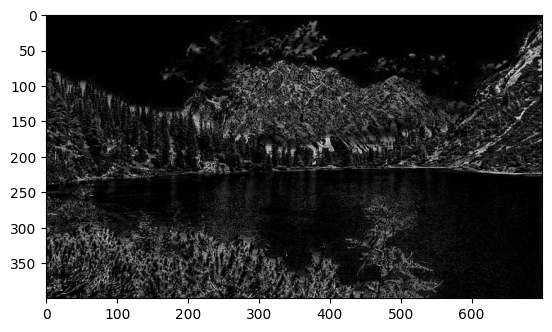

In [23]:
tophat = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_TOPHAT, kernel)

plt.imshow(tophat, cmap='gray')
plt.show()

### Black Hat <a class="anchor" id="black" ></a>

Output is a difference between input image & opened image
- Finds dark regions on a light background


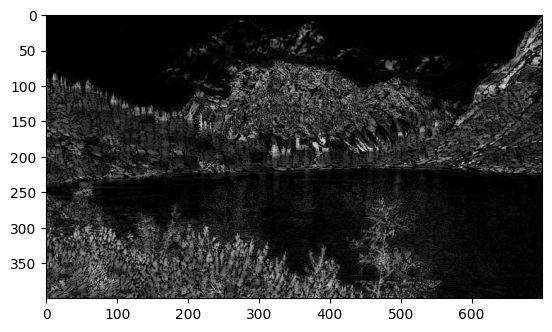

In [24]:
blackhat = cv2.morphologyEx(BGR2GRAY,cv2.MORPH_BLACKHAT,kernel)

plt.imshow(blackhat, cmap='gray')
plt.show()

## Exercises <a class="anchor" id="exercises" ></a>

In [100]:
# Function to plot original (color), grayscaled and Transformed Image
def plot_images_transformation(orig_img, gray_img, transformed, operation):
    plt.figure(figsize=([40, 40]))
    plt.subplot(131),plt.imshow(orig_img)
    plt.title('Color Image(RGB)'), plt.xticks([]), plt.yticks([])
    plt.subplot(132),plt.imshow(gray_img, cmap=plt.get_cmap('gray'))
    plt.title('Grayscale Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(133),plt.imshow(transformed, cmap=plt.get_cmap('gray'))
    plt.title(f'{operation} Image'), plt.xticks([]), plt.yticks([])
    
def plot_images_openOperation (img, manual, morphEx):
    plt.figure(figsize=([40, 40]))
    plt.subplot(131),plt.imshow(img, cmap=plt.get_cmap('gray'))
    plt.title('Noisy Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(132),plt.imshow(manual, cmap=plt.get_cmap('gray'))
    plt.title('Opened Image Erosion+Dilation'), plt.xticks([]), plt.yticks([])
    plt.subplot(133),plt.imshow(morphEx, cmap=plt.get_cmap('gray'))
    plt.title(f'MorphologyEx Image'), plt.xticks([]), plt.yticks([])

### A) Aplication of Erotion in Image Processing <a class="anchor" id="erotionapp" ></a>

Erosion in image processing is commonly used for removal of thin or irrelevant regions of an image, helping us to highlight relevant characteristics inside of them. [1]

Some of the practical uses we wanted to show are: 

- Image Segmentation: Erosion can be used to separate objects or regions in an image.


- Characteristic Extraction: Erosion also can be used for extract specific characteristics from an image like the shape or extension of a region.

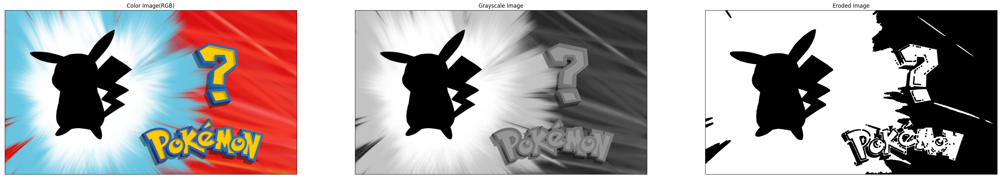

In [75]:
img = cv2.imread("data/pokemon.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# We changed our original image to a grayscale image in order to apply image binarization.
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# In this line we apply binarization, meaning the image can only consist of 2 values of intensity (100, 255)
# We use the index 1 where the thresholded image is stored in memory 
threshold = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)[1]

# We create a kernel of size nxn. All the elements of the kernel will be initialized to 1, and they will be used for the morphological transformation.
kernel = np.ones((4,4),np.uint8)

# We apply the erosion operation on the binarized image,
# We can modify the number of iterations. For our particular case, we believe 2 is a good number for the objective we want to prove.
erosion = cv2.erode(threshold, kernel, iterations = 2)

plot_images_transformation(img, gray, erosion, "Eroded")

In our example we can see how through using the erosion of our image we can extract some of the most relevant characteristics contained in the image like:

- One Pokémon.
- One question mark.
- The Pokémon Banner. 

Some of them like the Pokémon is extracted from the blinding light of the background, the question mark and the Pokémon banner are still a little bit fused with it. So maybe other techniques can be useful.

### B) Application of Dilation in Image Processing <a class="anchor" id="dilationapp" ></a>

Dilation is an image processing technique which adds pixels to the boundaries of objects in an image [2]. 

Some of the uses of dilation are:

- Enhance features on an image.
- Amplification of regions: It is used for amplifying regions of interest on an image, like increasing the size of an object.
- Edge enhancement: It is used to make edges of an image clearer and more defined.
- Noise reduction: Dilation is one of the most used techniques for noise reduction on images.
- Connectivity: Dilation allows us to enhance connectivity between connected components on an image.

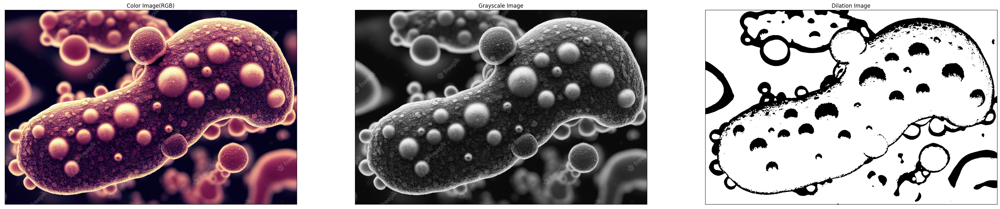

In [83]:
img = cv2.imread("data/microscope.jpeg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

threshold = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)[1]

invert = cv2.bitwise_not(threshold)

# For dilation we discovered that using an inverted image and no kernel allowed us to prove the point of feature enhancement.
dilation = cv2.dilate(invert, None, iterations = 2)

plot_images_transformation(img, gray, dilation, "Dilation")

We found that one of the main use cases for dilation on feature enhancement and region amplification is using it in images with small objects on it like scientist do with microscope images of cells, bacteria, or specs. 

For our scenario we found that using the inverted image of the grayscaled shows the details of the bacteria really well defined, with no background. 

For this scenario we can observe how dilation technique is useful to amplify the small regions and enhance the characteristics, making the detection an analysis easier.

### C) Application of Open and Closing Application <a class="anchor" id="openandcloseapp" ></a>

#### Application of Open operation

The opening operation is a morphological operation that is performed by applying an erosion operation, removing pixels on the boundaries of images, and then applying a dilation operation, which expands the remaining objects to fill in the gaps created by the erosion. [3]

This operation has different use cases such as:

- Reduce the number of objects in and images.
- Remove isolated pixels.
- Object extraction by removing small unwanted pixels.
- Background correction by correcting non-uniform illumination and smoothing in an image.
- Medical imaging: It can help us to remove noise and small objects to extract relevant structures for further analysis.

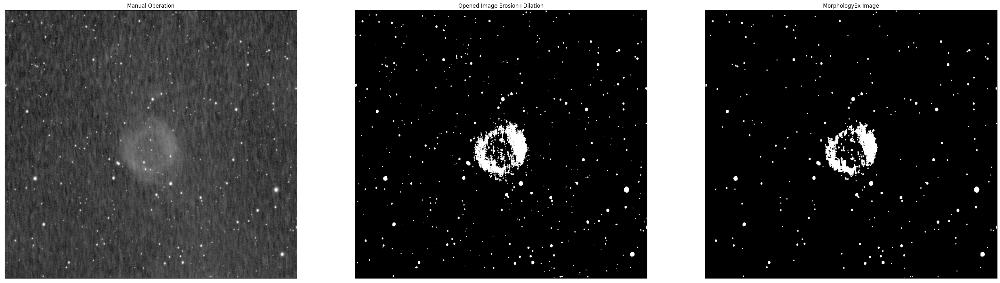

In [99]:
# We read the image as a grayscale image because it's best for background correction
gray =cv2.imread("data/astro.jpg", 0)

threshold = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)[1]

#invert = cv2.bitwise_not(threshold)
kernel = np.ones((3,3),np.uint8)

# We decided to show an opening operation using the 2 operations one at a time.
opImg = cv2.erode(threshold, kernel, iterations = 1)
opImg = cv2.dilate(opImg, kernel, iterations = 1)

# Then we also apply the operation using the morphologyEx method of openCV
openImg = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel, iterations=2)

plot_images_openOperation(gray, opImg, openImg)

We research that opening operation can be useful for astronomical purposes. In Astronomy there are often cases of noisy images due to the presence of thermal noise, scattered light and other sources of interference. Opening operation can be used in order to correct the background of images and remove this unwanted features, helping astronomers to improve visibility on the images captured by telescopes. [4]

In our image we have a noisy shot with a blurry background, once we applied the Opening technique we can see the black sky and all the light sources on the shot, even we see the cloud formation in the sky.

#### Application of Closing operation

Finally the closing operation is another of the  morphological operation we will discuss. This operation is performed by applying the reverse operation of the opening, First we apply a dilation operation, and then we apply the erosion operation. 

The use cases of this operation are:

- Object completion by filling the holes or gaps within objects in an image.
- Removing small objects.
- Closing contours.
- Image Smoothing.
- Medical Image.
- Image Restoration.
- Document and traffic analysis.
- Object Recognition.

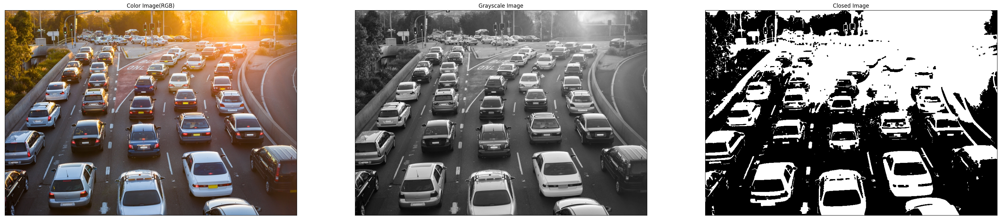

In [125]:
img = cv2.imread("data/traffic.jpeg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# We changed our original image to a grayscale image in order to apply image binarization.
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

threshold = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)[1]

kernel = np.ones((3,3),np.uint8)

clImg = cv2.dilate(threshold, kernel, iterations = 1)
clImg = cv2.erode(clImg, kernel, iterations = 1)


plot_images_transformation(img, gray, clImg, "Closed")

In our image you can see how image closing could be an used technique for object recognition and traffic analysis. We can see how this technique helps us in highlighting the objects contained in the image, in this case the cars on a traffic jam. 

This technique could be used in traffic analysis to identify and track vehicles in a video stream by closing gaps in the objects' contours. As you can see the vehicles on the closed images are well defined, except for the really bright part of the image. [5]

### References <a class="anchor" id="references"></a>

[1] Jankowski M (2006) - Erosion, dilation and related operators. University of Southern Maine, de usm.maine.edu

[2] Types of morphological operations - MATLAB & Simulink. Mathworks.com. 01/02/2023, de https://www.mathworks.com/help/images/morphological-dilation-and-erosion.html

[3] M. Masias, J. Freixenet, X. Lladó, M. Peracaula, A review of source detection approaches in astronomical images, Monthly Notices of the Royal Astronomical Society, Volume 422, Issue 2, May 2012, Pages 1674–1689, https://doi.org/10.1111/j.1365-2966.2012.20742.x

[4] Welk, M., & Breuß, M. (2014). Morphological amoebas and partial differential equations. En Advances in Imaging and Electron Physics (pp. 139–212). Elsevier.

[5] Harsha H., P.Ghonge (2013). Traffic Analysis Based On Image Processing. International Journal of Science and Research (IJSR) (pp. 2319-7064 )